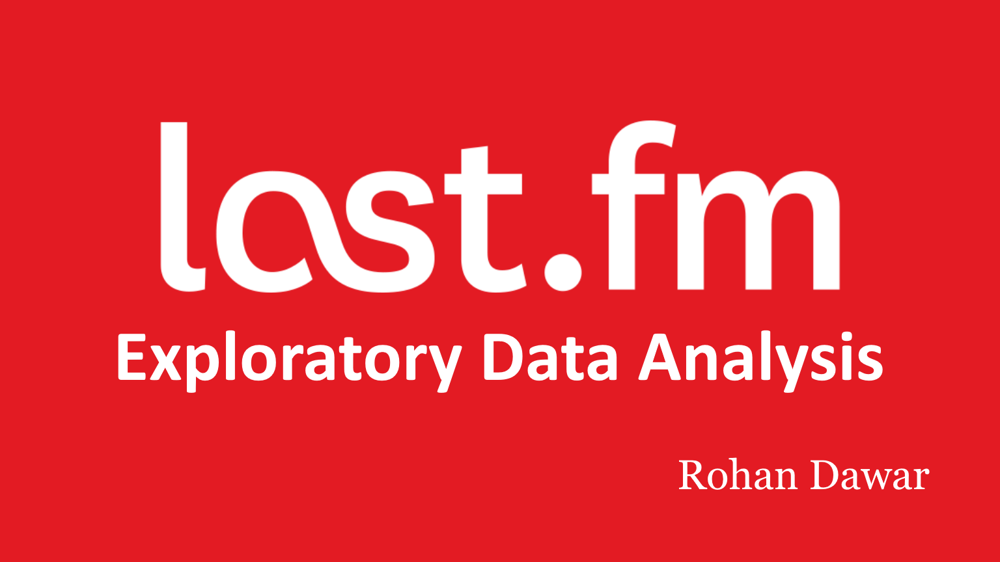

#**Last.FM Personal Exploratory Data Analysis**
* In this notebook I will performing an exploratory data analysis (EDA) of my music listening habits by analyzing data from my personal last.fm page.



---



### Author: Rohan Dawar
### dawar.rohan1@gmail.com
### [Website](https://www.rohandawar.com/)
### [Github](https://github.com/Rohan-Dawar/)
### [Jovian](https://jovian.ai/rohan-dawar)
### [Lastfm](https://www.last.fm/user/rmdawar)




---




## What is last.fm?
* Last.fm is a website that allows you to track your music listening habits among other things.
* A last.fm account can be automatically linked to a Spotify account and it will start sending "Scrobbles"
* A "Scrobble" is just one entry of a listened track on your last.fm page
* Scrobble data includes:
  * Track Name
  * Album Name
  * Artist Name
  * Album Artwork (if any)
  * Exact timestamp of listens



# **Outline**
## 1. [Installing & Importing Dependencies](#1)
## 2. [Connecting to the API](#2)
## 3. [Pandas DataFrame Cleaning](#3)
## 4. [Preliminary Analysis](#4)
## 5. [Deeper Analysis & Visualizations](#5)
## 6. [Summary](#6)
## 7. [References](#7)
## 8. [Future Work](#8)

<a name='1' id='1'></a>

---



#1. Installing & Importing Dependencies

In [1]:
!pip install plotly==5.3.1 --quiet
!pip install chart_studio --quiet
!pip install raceplotly --quiet
!pip install geopy --quiet
!pip install Nominatim --quiet

     |████████████████████████████████| 23.9 MB 14 kB/s 
     |████████████████████████████████| 64 kB 1.5 MB/s 


In [2]:
# Connecting To API
import getpass, math

# Data Handling
import numpy as np
import pandas as pd

# Datetime
from datetime import datetime, timedelta, timezone
from dateutil.parser import parse

# Visualization
import plotly.express as px
import plotly.graph_objects as go
from raceplotly.plots import barplot

# Mapping
import folium

# Web Scraping
import requests
from bs4 import BeautifulSoup

# Progress Bar
from tqdm import tqdm, trange

# String-Coordinate Matching
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut
from geopy.exc import GeocoderServiceError

# Embed
import chart_studio.tools as tls

# Setting Pandas Plotting Backend to Plotly
pd.options.plotting.backend = "plotly"

<a name='2' id='2'></a>

---



#2. Connecting to the API
a)   [API Authentication](#2a)

  * In depth information on this process can be found [here](https://www.last.fm/api/authentication)

b)   [Get Pages Function](#2b)

c)   [Get All Scrobbles DataFrame Function](#2c)

<a name='2a' id='2a'></a>
## 2a) API Authentication 

In [3]:
# Setting my unique API key
api_key = getpass.getpass()

··········


In [4]:
# Setting my lastfm username
user = 'rmdawar'

In [5]:
# Checking if the request is good
r = requests.get(f'https://ws.audioscrobbler.com/2.0/?method=user.gettoptracks&user={user}&api_key={api_key}&format=json')
if not r.ok:
  print(f"Error Connecting to API: {r}")

<a name='2b' id='2b'></a>
## 2b) Get Pages Function

In [6]:
# Function to get total pages of user's profile
def get_pages(user):
  '''
  Arguemnts:
    - 'user' (string), the lastfm user to get all tracks for
              - must be valid URL in the format: https://www.last.fm/user/{user}
  Returns:
    - 'pages' (int), number of total pages with a limit of 200 scrobbles each from the user's lastfm profile
  '''
  r = requests.get(f'https://ws.audioscrobbler.com/2.0/?method=user.getinfo&user={user}&api_key={api_key}&format=json')
  if not r.ok:
    print(f"Error Connecting to API: {r.status}")
  df = pd.read_json(r.content)
  totalscrobbles = int(df.loc['playcount'].values[0])
  return math.ceil(totalscrobbles/200)

In [7]:
get_pages(user)

368

<a name='2c' id='2c'></a>
## 2c) Get All Scrobbles DataFrame Function

In [8]:
# Function to get all tracks of user's profile, including other data in the JSON return
# This function takes an average of ~10 seconds per iteration and can take a while
def getAllTrax2(user):

  '''
  Arguemnts:
    - 'user' (string), the lastfm user to get all tracks for
              - must be valid URL in the format: https://www.last.fm/user/{user}
  '''

  alltraxdf = pd.DataFrame(columns=['artist', 'album', 'track', 'scrobbledate', 'url', 'duration', 'listeners', 'playcount', 'genre'])
  pages = get_pages(user)

  for page in trange(pages):
    p = page+1
    r = requests.get(f'https://ws.audioscrobbler.com/2.0/?method=user.getrecenttracks&user={user}&api_key={api_key}&page={p}&limit=200&format=json')
    if not r.ok:
      print(f"API Request Failed for page {p}")
    df = pd.read_json(r.content, typ='series')

    try:
      pageTracks = df['recenttracks']
    except KeyError:
      print(f'Recent Trax Error, request={r.ok}')

    for t in pageTracks['track']:
      artist = t['artist']['#text']
      track = t['name']

      # if artist + track already in alltraxdf, copy everything except for date (no need to make trackInfoRequest)

      anyPrevious = alltraxdf[(alltraxdf['artist'] == artist) & (alltraxdf['track'] == track)]

      if len(anyPrevious) > 0:
        trackInstance = anyPrevious.iloc[0]

        # scrobble date:
        try:
          date = t['date']['#text'].replace(',','')
        except KeyError:
          print(f"Date Keyerror on {t}")
          date = None

        newrow_df = pd.DataFrame({
                'artist' : artist,
                'album' : trackInstance['album'],
                'track' : track,
                'scrobbledate' : date,
                'url' : trackInstance['url'],
                'duration' : trackInstance['duration'],
                'listeners' : trackInstance['listeners'],
                'playcount' : trackInstance['playcount'],
                'genre' : trackInstance['genre']}, index=[0])
        
        alltraxdf = alltraxdf.append(newrow_df)

      else: # if no instance of the track is in the existing dataframe:
        trackInfoRequest = requests.get(f'http://ws.audioscrobbler.com/2.0/?method=track.getInfo&api_key={api_key}&artist={artist}&track={track}&format=json')

        if trackInfoRequest.ok:

          try:
            trackdf = pd.read_json(trackInfoRequest.content, typ='series')

            try:
              trackDict = trackdf['track']
            except KeyError:
              trackDict = trackdf


            # try to get toptag/genre
            try:
              toptag = trackDict['toptags']['tag'][0]['name']
            except (KeyError, IndexError):
              toptag = None

            # try to get duration
            try:
              trackDuration = trackDict['duration']
            except (KeyError, IndexError):
              trackDuration = None

            # try to get listeners (ie. amount of unique users who have recorded scrobbles of this track)
            try:
              trackListeners = trackDict['listeners']
            except (KeyError, IndexError):
              trackListeners = None

            # try to get playcount
            try:
              trackPlaycount = trackDict['playcount']
            except (KeyError, IndexError):
              trackPlaycount = None

          except ValueError: #no track info on page:
            toptag = None
            trackDuration = None
            trackListeners = None
            trackPlaycount = None

        else:
          print(f"Track Info Request={trackInfoRequest.ok}, for {artist} - {track}")

        # scrobble date:
        try:
          date = t['date']['#text'].replace(',','')
        except KeyError:
          print(f"Date Keyerror on {t}")
          date = None

        # New row containing all columns
        newrow_df = pd.DataFrame({
                  'artist' : artist,
                  'album' : t['album']['#text'],
                  'track' : track,
                  'scrobbledate' : date,
                  'url' : t['url'],
                  'duration' : trackDuration,
                  'listeners' : trackListeners,
                  'playcount' : trackPlaycount,
                  'genre' : toptag}, index=[0])
        
        # Add new row to the alltrax dataframe
        alltraxdf = alltraxdf.append(newrow_df)

  return alltraxdf

In [9]:
alltraxDF = getAllTrax2(user)

  4%|▍         | 15/368 [07:12<2:19:50, 23.77s/it]

API Request Failed for page 16
Recent Trax Error, request=False


100%|██████████| 368/368 [1:49:53<00:00, 17.92s/it]


In [10]:
alltraxDF

,artist,album,track,scrobbledate,url,duration,listeners,playcount,genre
0,Drake,Certified Lover Boy,Get Along Better,21 Sep 2021 00:11,https://www.last.fm/music/Drake/_/Get+Along+Be...,0,85802,244059,rnb
0,Drake,Certified Lover Boy,Fountains (with Tems),21 Sep 2021 00:08,https://www.last.fm/music/Drake/_/Fountains+(w...,0,89098,261419,rnb
0,Drake,Certified Lover Boy,Race My Mind,21 Sep 2021 00:03,https://www.last.fm/music/Drake/_/Race+My+Mind,0,99897,304917,pop
0,Drake,Certified Lover Boy,7am On Bridle Path,20 Sep 2021 23:59,https://www.last.fm/music/Drake/_/7am+On+Bridl...,0,107594,307181,hip hop
0,Drake,Certified Lover Boy,Knife Talk (with 21 Savage ft. Project Pat),20 Sep 2021 23:55,https://www.last.fm/music/Drake/_/Knife+Talk+(...,0,126743,520563,hip hop
...,...,...,...,...,...,...,...,...,...
0,Alvvays,Alvvays,"Archie, Marry Me",17 Apr 2018 20:14,"https://www.last.fm/music/Alvvays/_/Archie,+Ma...",197000,283456,2403831,indie
0,The Foundations,Build Me Up Buttercup,Build Me up Buttercup,17 Apr 2018 18:26,https://www.last.fm/music/The+Foundations/_/Bu...,159000,349515,1653146,oldies
0,Frank Ocean,Blonde,Nights,17 Apr 2018 18:21,https://www.last.fm/music/Frank+Ocean/_/Nights,0,498295,8655215,Progressive
0,The Turtles,Happy Together,Happy Together,17 Apr 2018 18:18,https://www.last.fm/music/The+Turtles/_/Happy+...,172000,619536,3411549,60s


In [11]:
alltraxDF.to_csv('sep20lastfm.csv')

In [12]:
# pick if from function OR upload:
# df = alltraxDF
df = pd.read_csv('/content/sep20lastfm.csv')
df

,Unnamed: 0,artist,album,track,scrobbledate,url,duration,listeners,playcount,genre
0,0,Drake,Certified Lover Boy,Get Along Better,21 Sep 2021 00:11,https://www.last.fm/music/Drake/_/Get+Along+Be...,0.0,85802.0,244059.0,rnb
1,0,Drake,Certified Lover Boy,Fountains (with Tems),21 Sep 2021 00:08,https://www.last.fm/music/Drake/_/Fountains+(w...,0.0,89098.0,261419.0,rnb
2,0,Drake,Certified Lover Boy,Race My Mind,21 Sep 2021 00:03,https://www.last.fm/music/Drake/_/Race+My+Mind,0.0,99897.0,304917.0,pop
3,0,Drake,Certified Lover Boy,7am On Bridle Path,20 Sep 2021 23:59,https://www.last.fm/music/Drake/_/7am+On+Bridl...,0.0,107594.0,307181.0,hip hop
4,0,Drake,Certified Lover Boy,Knife Talk (with 21 Savage ft. Project Pat),20 Sep 2021 23:55,https://www.last.fm/music/Drake/_/Knife+Talk+(...,0.0,126743.0,520563.0,hip hop
...,...,...,...,...,...,...,...,...,...,...
73587,0,Alvvays,Alvvays,"Archie, Marry Me",17 Apr 2018 20:14,"https://www.last.fm/music/Alvvays/_/Archie,+Ma...",197000.0,283456.0,2403831.0,indie
73588,0,The Foundations,Build Me Up Buttercup,Build Me up Buttercup,17 Apr 2018 18:26,https://www.last.fm/music/The+Foundations/_/Bu...,159000.0,349515.0,1653146.0,oldies
73589,0,Frank Ocean,Blonde,Nights,17 Apr 2018 18:21,https://www.last.fm/music/Frank+Ocean/_/Nights,0.0,498295.0,8655215.0,Progressive
73590,0,The Turtles,Happy Together,Happy Together,17 Apr 2018 18:18,https://www.last.fm/music/The+Turtles/_/Happy+...,172000.0,619536.0,3411549.0,60s


<a name='3' id='3'></a>

---



#3. Pandas DataFrame Cleaning
a)   [Datetime Objects](#3a)

b)   [ArtAlb & ArtTrack Columns](#3b)

c)   [Artist Metadata Webscraper](#3c)

d)   [Country & Deeper Geography](#3d)

<a name='3a' id='3a'></a>
## 3a) Datetime Objects

In [13]:
# Parse all date strings into datetime objects:
df['UTCdatetime'] = df['scrobbledate'].apply(parse)

In [14]:
# Timedelta all datetimes to Eastern Standard Time:
def utc_to_local(utc_dt):
    return utc_dt.replace(tzinfo=timezone.utc).astimezone(tz="EST")

df['datetime'] = df['UTCdatetime'].apply(utc_to_local)

In [15]:
# Specific columns for justdate, justmonth, justyear, justtime and day of week:
df['justdate'] = [d.date() for d in df['datetime']]
df['justmonth'] = df['justdate'].apply(lambda x : x.month)
df['justyear'] = df['justdate'].apply(lambda x : x.year)
df['justtime'] = df['datetime'].apply(lambda x : x.time())
df['weekday'] = df['justdate'].apply(lambda x : x.weekday())

<a name="3b" id="3b"></a>
## 3b) ArtAlb & ArtTrack Columns

In [16]:
# Unique identifier strings combining artist + track and artist + album:
df['artalb'] = df['artist'] + ' - ' + df['album']
df['artrack'] = df['artist'] + ' - ' + df['track']

<a name='3c' id='3c'></a>
## 3c) Artist Metadata Webscraper

In [17]:
# Artist Metadata Scraper:
def artistINFO(artistname):
  '''
  Arguemnts:
    - 'artistname' (string), derived from 'Born In' column of the artist combine
  Returns:
    - 'artistinfodf' (pandas DF), containing all available metadata from the web scraper
    - None, if metadata cannot be parsed using the web scraper
  '''
  base_url = 'https://www.last.fm/music/'
  urlArtist = artistname.replace(' ','+')
  url = base_url+urlArtist
  r = requests.get(url)
  if r.ok:
    soup = BeautifulSoup(r.text, 'html.parser')
    catalogue = soup.findAll(class_='catalogue-metadata')
    if not catalogue:
      return None
    else:
      try:
        headers = [heading.text for heading in catalogue[0].findAll('dt')]
        headers.insert(0, 'Artist')
        vals = [value.text for value in catalogue[0].findAll('dd')]
        vals.insert(0, artistname)
        metadict = dict(zip(headers, vals))
        artistinfodf = pd.DataFrame(metadict, index=[0])
        return artistinfodf
      except IndexError:
        # return None
        return pd.DataFrame({'Artist' : artistname})
  else:
    print(f"Error Making Request: {r}, Artist: {artistname}")

In [18]:
# Creating Artist Metadata DF:
combine = pd.DataFrame(columns=['Artist'])
listOfArtists = df['artist'].unique()

for artist in tqdm(listOfArtists):
  artdf = artistINFO(artist)
  combine = combine.append(artdf)

 38%|███▊      | 1522/4050 [26:32<37:20,  1.13it/s]

Error Making Request: <Response [404]>, Artist: Yusuf / Cat Stevens


 40%|████      | 1620/4050 [28:13<34:11,  1.18it/s]

Error Making Request: <Response [404]>, Artist: K/DA


 61%|██████    | 2456/4050 [42:04<26:22,  1.01it/s]

Error Making Request: <Response [404]>, Artist: Terror/Cactus


 62%|██████▏   | 2531/4050 [43:20<25:04,  1.01it/s]

Error Making Request: <Response [404]>, Artist: Smith/Hill


 82%|████████▏ | 3339/4050 [56:50<10:33,  1.12it/s]

Error Making Request: <Response [404]>, Artist: Nick Murphy / Chet Faker


100%|██████████| 4050/4050 [1:08:44<00:00,  1.02s/it]


In [19]:
combine

,Artist,Born,Born In,Years Active,Founded In,Died
0,Gus Dapperton,11 March 1997 (age 24),NaN,NaN,NaN,NaN
0,YEEK,1991 (age 30),NaN,NaN,NaN,NaN
0,SAYGRACE,8 April 1997 (age 24),"Brisbane, Queensland, Australia",NaN,NaN,NaN
0,Black Sabbath,NaN,NaN,1969 – 2017 (48 years),"Birmingham, West Midlands, England, United Kin...",NaN
0,Hachiku,NaN,"Detroit, Wayne County, Michigan, United States",NaN,NaN,NaN
...,...,...,...,...,...,...
0,TLC,NaN,NaN,1991 – present (30 years),"Atlanta, Fulton County, Georgia, United States",NaN
0,Zach Sobiech,3 May 1995,"Minnesota, United States",NaN,NaN,20 May 2013 (aged 18)
0,Mothica,12 March 1995 (age 26),"Oklahoma, United States",NaN,NaN,NaN
0,ANIMA!,NaN,NaN,2014 – present (7 years),NaN,NaN


In [20]:
combine.to_csv('sep20combine.csv')

In [21]:
# Manual Upload
combine = pd.read_csv('/content/sep20combine.csv')

<a name='3d' id='3d'></a>
## 3d) Country & Deeper Geography

In [22]:
def extract_country(bornin):
  '''
  Arguemnts:
    - 'bornin' (string), derived from 'Born In' column of the artist combine
  Returns:
    - 'country' (string), the country of the bornin string, the part after the last comma
  eg:
    bornin = 'Los Angeles, Los Angeles County, California, United States'
    returns = United States
  '''
  if type(bornin) == str:
    elements = bornin.split(',')
    country = elements[-1].lstrip()
    return country

In [23]:
combine['Country'] = combine['Born In'].apply(extract_country).dropna().append(combine['Founded In'].apply(extract_country).dropna())

In [24]:
def extract_subdiv(bornin, layer):
  '''
  Arguemnts:
    - 'bornin' (string), derived from 'Born In' column of the artist combine
    - 'layer' (int), the number of layers deep to extract
  Returns:
    - subdive (string), the subdivision of the bornin string, at the 'layer'
  eg:
    bornin = 'Los Angeles, Los Angeles County, California, USA'
    layer = 2
    returns = California
  '''
  i = layer*-1
  if type(bornin) == str:
    elements = bornin.split(',')
    subdiv = elements[i].lstrip()
    return subdiv

In [25]:
combine['Subdiv'] = combine['Born In'].apply(lambda x : extract_subdiv(x, 2)).dropna().append(combine['Founded In'].apply(lambda x : extract_subdiv(x, 2)).dropna())

<a name='4' id='4'></a>

---



#4. Preliminary Analysis
a)   [DataFrame Shape](#4a)

b)   [Scrobbles & Streaks](#4b)

c)   [Tracks](#4c)

d)   [Albums](#4d)

e)   [Artists](#4e)

  * [By Year](#4e2)

f)   [Genre](#4f)

g)   [Duration](#4g)

<a name='4a' id='4a'></a>

## 4a) DataFrame Shape

In [26]:
rows, cols = df.shape
print(f"Our Dataframe contains {rows} rows, each with {cols} columns")

Our Dataframe contains 73592 rows, each with 19 columns


<a name='4b' id='4b'></a>
## 4b) Scrobbles & Streaks
#### In this section, we'll take a look at the average (and rolling average) number of scrobbles per day, as well as find the longest streak of continuous daily scrobbling:

In [27]:
# Avg, Min, Max Scrobbles per day:
firstday = df.iloc[-1]['justdate']
lastday = df.iloc[0]['justdate']
totaldays = (lastday - firstday).days
totalScrobbles = len(df)
avgPD = round(totalScrobbles/totaldays, 2)
print(f'{user} scrobbles an average of {avgPD} tracks per day in the {totaldays} days active')

rmdawar scrobbles an average of 58.78 tracks per day in the 1252 days active


In [28]:
# Grouping Scrobbles by date, and counting how many occur per date:
ScrobsPDayDF = df.groupby(by='justdate').count()[['track']].reset_index()

In [29]:
# Finding the days in which no scrobbles were recorded:
my_range = pd.date_range(start=firstday, end=lastday)
days_with_no_scrobbles = my_range.difference(ScrobsPDayDF['justdate'])

In [30]:
# Setting up a dataframe for days without scrobbles
noScrobsDF = pd.DataFrame(days_with_no_scrobbles, columns=['justdate'])
noScrobsDF['track'] = 0

In [31]:
# Creating a justdate date object in this new dataframe:
noScrobsDF['justdate'] = noScrobsDF['justdate'].apply(lambda x : x.date())

In [32]:
# Combining both dataframes (the one with scrobbles per day and the one with 0 scrobbles per day)
ScrobsPDayDF = ScrobsPDayDF.append(noScrobsDF).sort_values(by='justdate')

In [33]:
# Creating a new column calculating a 7-day rolling average of scrobbles
ScrobsPDayDF['rollingavg7'] = ScrobsPDayDF['track'].rolling(7, min_periods=1).mean()

In [34]:
# Creating a new column to track the cuulative scrobble count
ScrobsPDayDF['cumulative'] = ScrobsPDayDF['track'].cumsum()

In [35]:
# Here's what this dataframe looks like now:
ScrobsPDayDF

,justdate,track,rollingavg7,cumulative
0,2018-04-17,43,43.000000,43
1,2018-04-18,46,44.500000,89
2,2018-04-19,100,63.000000,189
3,2018-04-20,30,54.750000,219
4,2018-04-21,74,58.600000,293
...,...,...,...,...
1218,2021-09-16,55,72.142857,73300
1219,2021-09-17,96,78.285714,73396
1220,2021-09-18,42,71.571429,73438
1221,2021-09-19,132,86.000000,73570


In [36]:
# Creating a new dataframe that will count continuous streaks:
streaksdf = pd.DataFrame(columns=['startdate', 'endate', 'datedelta', 'scrobbles'])

In [37]:
# Create a list of dates with no scrobbles
daysForStreaks = [x.date() for x in days_with_no_scrobbles]

In [38]:
# insert the first recorded day of scrobbling at the beginning position of the list:
daysForStreaks.insert(0, firstday)

In [39]:
# Insert the last day of recorded scrobbling at the end of the list:
# Append not working properly for datetimes?
daysForStreaks.insert(len(daysForStreaks), lastday)

In [40]:
# Append every streak into the streaks df:
for i, d in enumerate(daysForStreaks):
  try:
    streakend = daysForStreaks[i+1]
    datediff = (streakend - d).days
    streakdf = ScrobsPDayDF[(ScrobsPDayDF['justdate'] > d) & (ScrobsPDayDF['justdate'] <= streakend)]
    amount = streakdf['track'].sum()
    newrow = pd.DataFrame(
        {
          'startdate' : d,
          'endate' : streakend,
          'datedelta' : datediff,
          "scrobbles" : amount
        }, index=[0]
    )
    streaksdf = streaksdf.append(newrow)
  except IndexError:
    pass

In [41]:
# Here's what streaksdf looks like now:
streaksdf

,startdate,endate,datedelta,scrobbles
0,2018-04-17,2018-05-24,37,2551
0,2018-05-24,2018-06-21,28,1822
0,2018-06-21,2018-07-07,16,530
0,2018-07-07,2018-07-09,2,33
0,2018-07-09,2018-07-20,11,338
0,2018-07-20,2018-07-21,1,0
0,2018-07-21,2018-07-22,1,0
0,2018-07-22,2018-07-23,1,0
0,2018-07-23,2018-07-25,2,34
0,2018-07-25,2018-07-26,1,0


In [42]:
# Creating a vertical bar plot recording scrobbles per day

fig = px.bar(ScrobsPDayDF, x='justdate', y='track',
             title=f'{user} # of Scrobbles Every Day<br><sup>Average {avgPD} per day<br>Total days scrobbling: {totaldays}</sup>')

# Adding 7 day rolling average
fig.add_hline(y=avgPD, annotation_text=f'Average Scrobbles per Day: {avgPD}', annotation_position='bottom right')

# Add first scatter trace at row = 1, col = 1
fig.add_trace(go.Scatter(x=ScrobsPDayDF['justdate'], y=ScrobsPDayDF['rollingavg7'], line=dict(color='red'), name='7 Day Rolling Average'))

# Adding Streaks Rectangle
LSstart = streaksdf.max()['startdate']
LSend = streaksdf.max()['endate']

fig.add_shape(type="rect",
    x0=LSstart, y0=-1, x1=LSend, y1=-10,
    line=dict(
        color="RoyalBlue",
        width=2,
    ),
    fillcolor="LightSkyBlue",
    name='Longest Streak',
    opacity=.75,
    visible=True)

# Hover info for shape:
fig.add_trace(
  go.Scatter(
      x=[LSstart ,LSstart, LSend, LSend, LSstart], 
      y=[-1,-12,-12,-12,-1], 
      fill="toself",
      mode='lines',
      name = 'Longest Streak',
      text=f'{LSstart} to {LSend}<br>{streaksdf.max().datedelta} conescutive days of scrobbles<br>{streaksdf.max().scrobbles} scrobbles in this time',
      opacity=0))

fig.show()

#### 🔑 Viz Insight:
- Some days with high amounts of music listening are bringing up the average
- The longest continuous streak of daily scrobbling is still currently active

<a name='4c' id='4c'></a>

## 4c) Tracks
#### In this section, we'll visualize statistics for tracks and their number of plays:

In [43]:
# Avg, Min, Max Scrobbles per track:
avgPerTrack = round(df['artrack'].value_counts().mean(), 2)
nUniqueTRK = df['artrack'].nunique()
TrackPlaysdf = pd.DataFrame(df['artrack'].value_counts()).reset_index().rename(columns = {
    'index' : 'track',
    'artrack' : 'plays'})
px.box(TrackPlaysdf, y='plays', hover_name='track',
       title=f'{user} # of Plays / Track<br><sup>{nUniqueTRK} Unique Tracks<br>Average: {avgPerTrack} plays / track</sup>')

#### 🔑 Viz Insight:
- The median scrobbles per track is only 1, meaning most tracks in my library are only listened to once

In [44]:
# Top 10 Tracks Bar Plot:
top10tracks = df.groupby(['artrack', 'artist'], as_index=False).count()[['artrack', 'artist', 'track']].sort_values(by='track', ascending=False).head(10)
t10percent = round(top10tracks['track'].sum()/totalScrobbles*100, 2)

fig = px.bar(top10tracks, y= 'artrack', x= 'track', orientation='h', color='artist',
             title=f'{user} Top 10 Tracks<br><sup>Accounts for {t10percent}% of all scrobbles</sup>')
fig.update_xaxes(title='Scrobbles')
fig.update_yaxes(title='Top Tracks')
fig.update_layout(yaxis_categoryorder = 'total ascending')

#### 🔑 Viz Insight:
- 5 of top 10 songs are Frank Ocean

<a name='4d' id='4d'></a>

## 4d) Albums
#### In this section, we'll visualize statistics for albums and their number of plays:

In [45]:
# Avg, Min, Max Scrobbles per album:
avgPerAlbum = round(df['artalb'].value_counts().mean(), 2)
nUniqueALB = df['artalb'].nunique()
albumPlaysdf = pd.DataFrame(df['artalb'].value_counts()).reset_index().rename(columns = {
    'index' : 'album',
    'artalb' : 'plays'})
px.box(albumPlaysdf, y='plays', hover_name='album',
       title=f'{user} # of Plays / Album<br><sup>{nUniqueALB} Unique Albums<br>Average: {avgPerAlbum} plays / album</sup>')

#### 🔑 Viz Insight:
- The median scrobbles per album is only 2, meaning most albums in my library have realtively low number of listens

In [46]:
# Top 10 Albums
top10talbs = df.groupby(['artalb', 'artist'], as_index=False).count()[['artalb', 'artist', 'track']].sort_values(by='track', ascending=False).head(10)

t10ALBpercent = round(top10talbs['track'].sum()/totalScrobbles*100, 2)

fig = px.bar(top10talbs, y='artalb', x= 'track', color='artist', orientation='h',
             title=f'{user} Top 10 Albums<br><sup>Accounts for {t10ALBpercent}% of all scrobbles</sup>')
fig.update_xaxes(title='Scrobbles')
fig.update_yaxes(title='Top Albums')
fig.update_layout(yaxis_categoryorder = 'total ascending')

#### 🔑 Viz Insight:
- 7 of top 10 albums are from 3 artists: Frank Ocean, Bon Iver & Tame Impala

<a name='4e' id='4e'></a>

## 4e) Artists
#### In this section, we'll visualize statistics for artists and their number of plays:

In [47]:
# Avg, Min, Max Scrobbles per artist:
avgPerArtist = round(df['artist'].value_counts().mean(), 2)
nUniqueART = df['artist'].nunique()
artistPlaysdf = pd.DataFrame(df['artist'].value_counts()).reset_index().rename(columns = {
    'index' : 'artist',
    'artist' : 'plays'})
px.box(artistPlaysdf, y='plays', hover_name='artist',
       title=f'{user} # of Plays / Artist<br><sup>{nUniqueART} Unique Artists<br>Average: {avgPerArtist} plays / artist</sup>')

In [48]:
# Top 10 Artists Bar Plot:
top10tartists = df['artist'].value_counts().head(10)
top10tartists = pd.DataFrame(top10tartists).reset_index().rename(columns={
    'index' : 'artist',
    'artist' : 'plays'})

# Check if artist is band or solo:
top10tartists['IsBand'] = top10tartists['artist'].apply(lambda x : (x in combine[combine['Founded In'].notnull()]['Artist'].values) )

t10ARTpercent = round(top10tartists['plays'].sum()/totalScrobbles*100, 2)
fig = px.bar(top10tartists, y=top10tartists['artist'], x=top10tartists['plays'], color=top10tartists['IsBand'], orientation='h',
             title=f'{user} Top 10 Artists<br><sup>Accounts for {t10ARTpercent}% of all scrobbles</sup>')
fig.update_xaxes(title='Scrobbles')
fig.update_yaxes(title='Top Artists')
fig.update_layout(yaxis_categoryorder = 'total ascending')

#### 🔑 Viz Insight:
- Equal mix of bands and solo artists in my top 10
- These 10 artists account for almost a quarter (23.5%) of all my music listening!

<a name='4e2' id='4e2'></a>

### 4e ii) Artists By Year
#### Now let's take a look at who were the top artists every year:

In [49]:
# Artist By Year Grouping
artistbyyear = df.groupby(by=['artist', 'justyear']).count()[['track']]

In [50]:
# Reset Index
aby = artistbyyear.reset_index()

In [51]:
# Artist By Year Striplot:
fig = px.strip(aby, x='justyear', y='track', title=f"{user} Artist Scrobbles by Year", hover_name='artist')
fig.update_traces(marker_size=4, marker_opacity=0.7)
fig.show()

#### 🔑 Viz Insight:
- Bon Iver in 2019 and Drake in 2021 had over 1000 plays!

<a name='4f' id='4f'></a>

## 4f) Genre
#### In this section we'll take a look at the top genres. Keep in mind that genre data is based on the top tag that was able to be parsed from a track in the [GetAllTrax function](#link), and is not always the most relevant tag

In [52]:
# Number of unique genres
numgenres = df['genre'].nunique()

In [53]:
# Top 10 Genres Bar Plot
top10genres = df['genre'].value_counts().head(10)
top10genrePCT = round(top10genres.sum() / totalScrobbles*100, 2)
fig = px.bar(y= top10genres.index, x= top10genres.values, orientation='h',
             title=f'{user} Top 10 Genres<br><sup>Accounts for {top10genrePCT}% of all scrobbles<br>{numgenres} Unique Genres Parsed</sup>')
fig.update_xaxes(title='Scrobbles')
fig.update_yaxes(title='Top Genres')
fig.update_layout(yaxis_categoryorder = 'total ascending')

#### 🔑 Viz Insight:
- My top 10 genres account for more plays (35.29%) than my top 10 artists do (23.5%)
- Some redundencies in genre tags ie. Hip-Hop vs. hip hop

In [54]:
# Top 10 vs others:
topgenres = df['genre'].value_counts()
topgenrestop = topgenres[:10]
topgenrestop['Others'] = topgenres[10:].sum()

In [55]:
# Top Gendre DF
topgenredf = pd.DataFrame(topgenrestop).reset_index()

In [56]:
# Pie Plot of Top Genres and Others:
px.pie(topgenredf, names='index', values='genre',
       title=f'{user} Top Genres<br><sup>Genres derived from primary tag on track metadata</sup>')

#### 🔑 Viz Insight:
- 52% of tracks with parseable genres are outside my top 10 genres!
- indie and Hip Hop are most accurate as my top genres

<a name='4g' id='4g'></a>

## 4g) Duration
#### In this section, we'll create a histogram of track durations to find out the most common lengths of songs:

In [57]:
# Scrobbles where the duration value exists:
durationdf = df[df['duration'].notnull()]

In [58]:
# Scrobbles where the duration value is not 0:
durationdf = durationdf[durationdf['duration'] != 0]
pctWDurationData = round(len(durationdf)/totalScrobbles*100, 2)

In [59]:
# Duration as integer type (milliseconds):
durationdf['duration'] = durationdf['duration'].astype(int)

In [60]:
# Converting millisecond duration into second duration
durationdf['durationseconds'] = durationdf['duration'] / 1000

In [61]:
# Finding the mean duration of all tracks:
durationMean = round(durationdf['durationseconds'].mean(), 2)

In [62]:
# Creating a histogram of track durations:
fig = px.histogram(durationdf, x='durationseconds',
                   title=f'{user} Track Duration Histogram<br><sup>Average Track Duration: {durationMean} seconds<br>Based on {pctWDurationData}% Scrobbles with duration data</sup>',
                   marginal='box')
fig.update_xaxes(title='Duration (seconds)', tickmode='array', tickvals= list(range(0, int(durationdf['durationseconds'].max()),60)))

In [63]:
# Creating a histogram of track durations with wider bins:
fig = px.histogram(durationdf, x='durationseconds',
                   title=f'{user} Track Duration Histogram<br><sup>Average Track Duration: {durationMean} seconds<br>Based on {pctWDurationData}% Scrobbles with duration data</sup>',
                   marginal='box', nbins=60)
fig.update_xaxes(title='Duration (seconds)', tickmode='array', tickvals= list(range(0, int(durationdf['durationseconds'].max()),60)))

#### 🔑 Viz Insight:
- Duration lengths of tracks in my library follow a normal distribution
- The average length of songs in my library is 226.5 seconds or ~3m46s
- The median length of songs in my library is 219 seconds or ~3m39s
- The longest song in my library is 1613 seconds or 26m53s!
* *note* : last.fm only counts a song as a scrobble if more than half the track is played 



---



#5. Deeper Analysis & Visualizations
### Answering specific questions in regards to:
a) [Milestones](#5a)
  * [Current Top Artists Over Time](#5a2)
  * [Top Artists Over Time](#5a3)

b) [Discoveries](#5b)

c) [Debuts](#5c)
  * [Artists by Top Breakout Year](#5c2)

d) [Geography](#5d)
  * [Artists By Geographical Subdivision](#5d2)
  * [Mapping Artist's Origins in Folium](#5d3)
  * [Bands vs. Solo Artists](#5d4)
  * [GeoData Sankey](#5d5)

e) [Age](#5e)
  * [Age of Bands](#5e2)

f) [Mainstream](#5f)

g) [Datetime Analysis](#5g)
  * [Scrobbles by Day of Week](#5g2)
  * [Scrobbles by Month of Year](#5g3)

h) [Artist / Album Splits](#5h)

<a name='5a' id='5a'> </a>
## 5a) Milestones
### Question: When did I reach 10k scrobbles, 20k, 30k 50k etc. on my account?

In [64]:
# Creating a line of total scrobbles over time:

fig = px.line(df, x='datetime', y=[totalScrobbles-y for y in range(totalScrobbles)],
              hover_name=[totalScrobbles-y for y in range(totalScrobbles)],
              hover_data=["artist", "album", "track"],
              title=f'{user} Total Scrobbles Over Time')

milestones = pd.DataFrame()
for i in range(0, totalScrobbles, 10_000)[1:]:
  milestones = milestones.append(df.iloc[totalScrobbles-i])

# Add scatter trace with medium sized markers
fig.add_trace(
    go.Scatter(
        mode='markers',
        x = milestones['datetime'],
        y = list(range(0, totalScrobbles, 10_000)[1:]),
        marker=dict(
            color='LightSkyBlue',
            size=20,
            line=dict(
                color='MediumPurple',
                width=2
            )
        ),
        showlegend=False
    )
)

fig.update_yaxes(title=f'{user} Total Scrobbles')

#### 🔑 Viz Insight:
- Scrobbles over time are fairly even, with 10k scrobble intervals happening around every March and August

<a name='5a2' id='5a2'></a>

### 5a ii) Current Top Artists Over Time
#### How did my current top artists get to where they are now?

In [65]:
# Top 10 Artists List
t10artists = df['artist'].value_counts().head(10).index

In [66]:
# Groupby Justdate and get cumulative sum of tracks
top10artistCumulative = pd.DataFrame()

for artist in t10artists:
  artdf = df[df['artist'] == artist]
  artdfByDay = pd.DataFrame(artdf.groupby(by='justdate').count()['track'])
  artdfByDay['Cumulative'] = artdfByDay['track'].cumsum()
  artdfByDay['Artist'] = artist
  top10artistCumulative = top10artistCumulative.append(artdfByDay)

# Resetting index
top10artistCumulative = top10artistCumulative.reset_index()

In [67]:
# Line chart for top 10 artists cumulative scrobbles over time:
px.line(top10artistCumulative, x='justdate', y='Cumulative', color='Artist', title=f'{user} Top 10 Artists Scrobbles over Time')

#### 🔑 Viz Insight:
- Artists can 'jump' up at inflection points, often when new music is released

<a name='5a3' id='5a3'></a>

### 5a iii) Top Artists Over Time
#### How have my top artists changed over time?

In [68]:
# Month of Year column:
df['mnth_yr'] = df.datetime.dt.to_period('M')

/usr/local/lib/python3.7/dist-packages/pandas/core/arrays/datetimes.py:1092: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



In [69]:
# Creating an artist cumulative plays dataframe:
acgbMONTH = df.groupby(['artist', 'mnth_yr'], as_index=False).count()[['artist', 'mnth_yr', 'track']]
acgbMONTH['cumsum'] = acgbMONTH.groupby('artist')['track'].transform(pd.Series.cumsum)
acgbMONTHPiv = acgbMONTH.pivot_table(values='cumsum', columns='mnth_yr', index='artist')
acgbMONTHFilled = acgbMONTHPiv.ffill(axis=1).fillna(0)
acgbMONTHstacked = pd.DataFrame(acgbMONTHFilled.stack()).reset_index().rename(columns={0 : 'cumplays'})

In [70]:
# Bar Chart Race:
my_raceplot = barplot(acgbMONTHstacked, item_column='artist', value_column='cumplays', time_column='mnth_yr')
my_raceplot.plot(item_label = 'Top Artists', value_label = 'Cumulative Scrobbles', frame_duration = 600, title=f'{user} Top 10 Artists Over Time')

#### 🔑 Viz Insight:
- Some artists like Frank Ocean, Bon Iver and Brockhampton have been top artists of mine since very early on

<a name='5b' id='5b'> </a>
## 5b) Discoveries
### Question: When did I discover the most new artists?

In [71]:
# Creating an artist discovery dataframe:
artist_discovery_df = pd.DataFrame(columns=['day', 'newartists', 'totalartists'])
artist_library = []

In [72]:
# Populating the artist discovery dataframe with amount discovered per day
for d in reversed(df['justdate'].unique()):
  newarts = 0
  daydf = df[df['justdate'] == d]
  for artist in daydf['artist'].unique():
    if artist not in artist_library:
      artist_library.append(artist)
      newarts += 1
  newrow = {'day' : d,
            'newartists' : newarts,
            'totalartists' : len(artist_library)}
  newrow_df = pd.DataFrame(newrow, index=[0])
  artist_discovery_df = artist_discovery_df.append(newrow_df)

In [73]:
# Get 7 day rolling average of artist discoveries:
artist_discovery_df['discovery_rollingavg'] = artist_discovery_df['newartists'].rolling(7, min_periods=1).mean()

In [74]:
# Line plot of Artist Discoveries with 7 Day Rolling AverageL
fig = px.line(artist_discovery_df, x='day', y='discovery_rollingavg', title=f'{user} 7 Day Rolling Average for New Artist Discovery')
fig.add_scatter(x=artist_discovery_df['day'], y=artist_discovery_df['newartists'], mode='lines', visible='legendonly', name='True Value')
fig.update_yaxes(title='Average # of New Artists Discovered That Week')
              
fig.show()

#### 🔑 Viz Insight:
- Certain days with very high discoveries are bringing up the rolling average
- These days may be due to listening to new playlists with many different new artists in them

<a name='5c' id='5c'> </a>
## 5c) Debuts
### Question: Which Artists, Albums and Tracks did I listen to the most in the first week of discovery?

In [75]:
# Function that returns the debut (amount of scrobbles in initial period of time) of an entry (artist, album or track)
def GetDebut(t, entry, debut=7):
  '''
  Arguemnts:
    - 't' (string), must be either 'artist', 'artalb', OR 'artrack'
    - 'entry' (string), must be valid name of the type t ^
    - 'debut', (int), number of days to check the amount of scrobbles for, default 7
  Returns:
    - number of scrobbles of entry in the debut time period
  '''
  entrydf = df[df[t] == entry]
  debutDate = entrydf['justdate'].min()
  try:
    weeklater = debutDate + timedelta(days = debut)
    entry_debut = df[(df[t] == entry) & (debutDate <= df['justdate']) & (df['justdate'] <= weeklater)]
    return (len(entry_debut), debutDate)
  except TypeError:
    pass

In [76]:
# Function to plot the top entry (artist, album or track) debuts on a bar graph
def PlotEntryDebuts(t, topN, debDay=7):
  '''
  Arguemnts:
    - 't' (string), must be either 'artist', 'artalb', OR 'artrack'
    - 'topN' (int), the amount of entries to consider
    - 'debDay', (int), number of days to check the amount of scrobbles for, default 7
  Returns:
    - Bar plot of the topN entries debuts over the debDay
  '''
  tTitle = t.title()
  uniqueToTypesDF = pd.DataFrame(df[t].unique()).rename(columns = {0 : tTitle})
  uniqueToTypesDF['debutWithYear'] = uniqueToTypesDF[tTitle].apply(lambda x : GetDebut(t, x, debut=debDay))
  uniqueToTypesDF[['debut', 'debutyear']] = pd.DataFrame(uniqueToTypesDF['debutWithYear'].tolist(), index=uniqueToTypesDF.index)
  
  # Getting Top 20 Debuts:
  topEntriesDebuts = uniqueToTypesDF.sort_values('debut', ascending=False).head(topN)

  # Converting debutyear to string for discrete color mapping:
  topEntriesDebuts["debutyear"] = topEntriesDebuts["debutyear"].apply(lambda x : x.year).astype(str)

  # Top Artist Debuts Bar Plot:
  fig = px.bar(topEntriesDebuts, x='debut', y=tTitle, color='debutyear', orientation='h',
               title=f'{user} Top {topN} {tTitle}s in first {debDay} days of discovery')
  fig.update_layout(yaxis_categoryorder = 'total ascending')
  fig.update_xaxes(title='Scrobbles In First Week Of Discovery')
  fig.show()

In [77]:
# Top Artist by first 7-Day Debut:
PlotEntryDebuts('artist', 20)

#### 🔑 Viz Insight:
- Most big artist debuts are from 2018 (when I made my lastfm account)
- Calb is the only artist discovered in 2021 with a high debut

In [78]:
# Top Albums by first 7-Day Debut:
PlotEntryDebuts('artalb', 20)

#### 🔑 Viz Insight:
- My album debuts seem to overall be higher than artist or track debuts
  * this is likely due to album debuts being from artists I already listen to and am anticipating the album
- Drake's Certified Lover Boy was highly played in the first week of listening

In [79]:
# Top Tracks by first 7-Day Debut:
PlotEntryDebuts('artrack', 20)

#### 🔑 Viz Insight:
- Many of my highest track debuts were in 2021

<a name='5c2' id='5c2'></a>

### 5c ii) Artists by Top Breakout Year
#### Most scrobbles in the year of their discovery (to the end of the calendar year):

In [80]:
artist_debuts_df = pd.DataFrame(df['artist'].unique()).rename(columns = {0 : 'Artist'})

In [81]:
artist_debuts_df['debut_date'] = artist_debuts_df['Artist'].apply(lambda x : df[df['artist'] == x]['justdate'].min() )

In [82]:
artist_debuts_df['debut_year'] = artist_debuts_df['debut_date'].apply(lambda x : x.year)

In [83]:
artist_debuts_df['scrobbles_that_year'] = artist_debuts_df.apply(lambda row : len(df[(df['artist'] == row['Artist']) & (df['justyear'] == row['debut_year'])]),
                                                                 axis=1)

In [84]:
artist_debuts_df = artist_debuts_df.sort_values(by='scrobbles_that_year', ascending=False)

In [85]:
artist_debuts_df['debut_year'] = artist_debuts_df['debut_year'].astype(str)

In [86]:
fig = px.bar(artist_debuts_df.head(20), x='scrobbles_that_year', y='Artist', color='debut_year', orientation='h',
             title=f'{user} Top Breakout Artists by Year<br><sup>Artists with the most scrobbles in the year of discovery</sup>')
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total ascending'})
fig.update_layout(yaxis_categoryorder = 'total ascending')
fig.show()

#### 🔑 Viz Insight:
- Only 3 Artists with top breakout years were not in 2018

<a name='5d' id='5d'> </a>
## 5d) Geography
### Question: Where are the artists I listen to from? Where were the bands I listened to founded?

In [87]:
withGeoData = len(combine[combine['Country'].notnull()])
pct = int(withGeoData/len(combine)*100)
print(f"Of {user}'s {len(combine)} Artists, {withGeoData}, or {pct}% Have GeoData")

Of rmdawar's 2304 Artists, 2090, or 90% Have GeoData


In [88]:
top10countries = combine['Country'].value_counts().head(10)
fig = px.bar(y=top10countries.index, x=top10countries.values, orientation='h', color=top10countries.index,
             color_discrete_sequence = px.colors.qualitative.G10,
             title=f"{user} Top 10 Artist Origin Countries<br><sup>{withGeoData}/{len(combine)} of {user}'s Artists, or {pct}% Have GeoData</sup>")
fig.update_xaxes(title='# Of Artists From Country')
fig.update_yaxes(title='Country')
fig.update_layout(showlegend=False, yaxis_categoryorder = 'total ascending')

#### 🔑 Viz Insight:
- Most artists originate in the United States
- The anglosphere in general is quite high (UK, Canada, Australia), likely because I listen to mainly English language music

In [89]:
# Creating a dictionary of countries and their values:
countryCount = pd.DataFrame(combine['Country'].value_counts()).reset_index().rename(columns={
    'index' : 'Country',
    'Country' : 'Count'})

In [90]:
fromTopCountry = round(countryCount.iloc[0]['Count'] / withGeoData *100, 2)

In [91]:
# USA vs. Stacked of Others Bar Plot
fig = px.bar(countryCount, y=np.where(countryCount["Country"].eq("United States"), "United States", "Others"), x="Count", 
       hover_name="Country", hover_data=['Count'], color="Country", orientation='h',
       title=f'{user} Artist Origins, USA vs. Elsewhere<br><sup>Of the {pct}% of artists with GeoData, {fromTopCountry}% of those are from USA</sup>')

fig.update_layout(showlegend=False, yaxis_categoryorder = 'total ascending')
fig.show()

#### 🔑 Viz Insight:
- Almost 60% of my artists are from the USA!

<a name='5d2' id='5d2'></a>

### 5d ii) Artists By Geographical Subdivision
#### Now let's take a look where within these countries the artists are from:

In [92]:
# Top Subdivisions Bar Chart
top12subdivs = combine.groupby(['Subdiv', 'Country'], as_index=False).count().rename(columns={'Unnamed: 0' : 'Count'})[['Subdiv', 'Country', 'Count']].sort_values(by='Count', ascending=False).head(12)
pctinTop12 = round(top12subdivs['Count'].sum()/withGeoData*100, 2)

fig = px.bar(top12subdivs, y='Subdiv', x='Count', color='Country', orientation='h',
             title=f'{user} Top 10 Artist Origin Subdivisions<br><sup>Of the {pct}% of artists with GeoData, {pctinTop12}% are from these 12 subdivisions</sup>')
fig.update_xaxes(title='# Of Artists From Subdivision')
fig.update_yaxes(title='Subdivision')
fig.update_layout(showlegend=True, yaxis_categoryorder = 'total ascending')

#### 🔑 Viz Insight:
- My artists come mainly from the most populous subdivisions of the USA, UK, Canada and France

<a name='5d3' id='5d3'></a>

### 5d iii) Mapping Artist's Origins in Folium
#### Now let's take a look the map of artist's origins:

In [93]:
# Dataframe of top Born In Destinations
bornindf = pd.DataFrame(combine['Born In'].value_counts()).reset_index()

In [94]:
# Function to get coordinates from city name

def get_coords(city, country=None):
  '''
  Arguments: 
    - city (string) : Name of a city
    - country (string, optional) : Name of the country the city is in, default to None, usually city name is enough
  Returns:
    - (latitude, longitude) tuple, or (0,0) if error
  '''

  try:
    geolocator = Nominatim(user_agent="my-application");

    if country:
      loc = geolocator.geocode(city+','+ country, timeout=None)

    else:
      loc = geolocator.geocode(city, timeout=None)

    return (loc.latitude,loc.longitude)

  except AttributeError:

    try:
      newcity = city.split(',')[0]
      loc = geolocator.geocode(newcity, timeout=None)
      return (loc.latitude,loc.longitude)
      
    except AttributeError:
      newcity = city.split(',')[0]
      newcountry = city.split(',')[-1].lstrip()
      loc = geolocator.geocode(newcity + ',' + newcountry, timeout=None)
      try:
        return (loc.latitude,loc.longitude)
      except AttributeError:
        # loc has no latitude?
        return (0, 0)
      

  except (GeocoderServiceError, GeocoderTimedOut):

    print(f'Timed Out on {city}')

    try:
      newcity = city.split(',')[0]
      newcountry = city.split(',')[-1].lstrip()

      loc = geolocator.geocode(newcity + ',' + newcountry, timeout=None)
      return (loc.latitude,loc.longitude)

    except (GeocoderServiceError, GeocoderTimedOut):
      return (0,0)

In [95]:
bornindf['coords'] = bornindf['index'].apply(get_coords)

Timed Out on Stockholm, Stockholm municipality, Stockholms län, Sweden
Timed Out on Vancouver, Metro Vancouver, British Columbia, Canada
Timed Out on Hollywood, Los Angeles, Los Angeles County, California, United States
Timed Out on Sheffield, South Yorkshire, England, United Kingdom


In [96]:
# Creating Base Map for born in
m = folium.Map(tiles='CartoDB positron')

In [97]:
# Adding every coordinate from the Born In Dataframe
for i in range(len(bornindf)):
  d = bornindf.iloc[i]
  cds = d['coords']
  name = d['index']
  r = int(d['Born In'])
  puString = f'{name} | {r}'

  folium.Circle(
    radius= r*700,
    location=cds,
    popup = name,
    color = 'red',
    fill=True,
    tooltip = puString).add_to(m)

In [98]:
# Artists Born In Map:
m

#### 🔑 Viz Insight:
- We can see many of my artists were born in the USA and Europe, with a few scattered around the other continents

In [99]:
# Function to check if coordinates are already in the born in dataframe
def check_if_already_coords(s):
  if s in bornindf['index'].values:
    c = bornindf[bornindf['index'] == s]['coords'].values[0]
  else:
    c = get_coords(s)
  return c

In [100]:
# Creating a founded in dataframe
foundedindf = pd.DataFrame(combine['Founded In'].value_counts()).reset_index()

In [149]:
# Populating the founded in dataframe with coordinates
foundedindf['coords'] = foundedindf['index'].apply(check_if_already_coords)

In [150]:
# Checking where coordinates were not found
foundedindf[foundedindf['coords'] == (0,0)]

,index,Founded In,coords
302,"Lidköping Municipality, Västra Götaland, Sweden",1,"(0, 0)"


In [151]:
idxToChange = foundedindf[foundedindf['index'] == 'Lidköping Municipality, Västra Götaland, Sweden'].index[0]

In [152]:
# Manually setting empty coords
foundedindf.at[idxToChange, 'coords'] = (58.5, 13.183333)

In [153]:
# Creating a base map for founded in
m2 = folium.Map(tiles='CartoDB positron')

In [154]:
# Adding founded in coordinates to map
for i in range(len(foundedindf)):
  d = foundedindf.iloc[i]
  cds = d['coords']
  name = d['index']
  r = int(d['Founded In'])
  puString = f'{name} | {r}'

  folium.Circle(
    radius= r*700,
    location=cds,
    popup = name,
    color = 'blue',
    fill=True,
    tooltip = puString).add_to(m2)

In [155]:
# Bands founded in map:
m2

#### 🔑 Viz Insight:
- Most of my bands were formed in the US and UK, with comparatively less in the other continents than the locations of birth

<a name='5d4' id='5d4'></a>
### 5d iv) Bands VS Solo Artists
#### While not explicitly geographic data, the bands vs. solo artists split is derived from the amount of Born In vs. Founded In data

In [156]:
# Amount with Born In Data and Founded in Data
amountWithBornData = len(combine[combine['Born In'].notnull()])
amountWithFoundedData = len(combine[combine['Founded In'].notnull()])

In [157]:
# Amount with GeoData
amountWithData = len(combine[combine['Born In'].notnull() | combine['Founded In'].notnull()])

In [158]:
# Percent with GeoData
percentWData = round(amountWithData/len(combine)*100, 2)

In [159]:
# Pie Chart
px.pie(values=[amountWithBornData, amountWithFoundedData], names=['Solo Artists', 'Bands'],
       title=f'{user} Solo Artists vs. Bands<br><sup>Extrapolated from the {percentWData}% of artist pages containing metadata</sup>')

#### 🔑 Viz Insight:
- Just over 1/3 of my artists are bands and the rest are solo acts!

<a name='5d5' id='5d5'></a>
### 5d v) GeoData Sankey
#### Another way to visualize this is with a [Sankey Diagram](#https://en.wikipedia.org/wiki/Sankey_diagram) to visualize the flow between available data and geodata:

In [160]:
# Specific Geo Criteria Dataframes
borninUSA = combine[(combine['Born In'].notnull()) & (combine['Country'] == 'United States')]
borninUK = combine[(combine['Born In'].notnull()) & (combine['Country'] == 'United Kingdom')]

foundedinUSA = combine[(combine['Founded In'].notnull()) & (combine['Country'] == 'United States')]
foundedinUK = combine[(combine['Founded In'].notnull()) & (combine['Country'] == 'United Kingdom')]

bornElswhere = combine[(combine['Born In'].notnull()) & (combine['Country'] != 'United Kingdom') & (combine['Country'] != 'United States')]
FoundedElswhere = combine[(combine['Founded In'].notnull()) & (combine['Country'] != 'United Kingdom') & (combine['Country'] != 'United States')]

USAoutsideCANY = combine[(combine['Country'] == 'United States') & (combine['Subdiv'] != 'California') & (combine['Subdiv'] != 'New York')]

In [161]:
# Sankey Attributes
sankeylabels = ['Total Artists', 'Artists w/o metadata', 'Artists w/ metadata', 'Artists w/ geodata', 'Artists w/o geodata',
                'Solo Artists', 'Bands', 'From U.S.A 'u"\U0001F1FA"u"\U0001F1F8", 'From U.K. 'u"\U0001F1EC"u"\U0001F1E7", 'From Elsewhere'u"\U0001F30D",
                'From California', 'From New York State', 'From Other State', 'From England', 'Other U.K.']
sksource = [0, 0, 2, 2, 3, 3, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8]
sktarget = [1, 2, 3, 4, 5, 6, 7, 8, 9, 7, 8, 9, 10, 11, 12, 13, 14]
skvalue =  [len(df['artist'].unique())-len(combine), len(combine), amountWithData, len(combine)-amountWithData, amountWithBornData, amountWithFoundedData,
            len(borninUSA), len(borninUK), len(bornElswhere), len(foundedinUSA), len(foundedinUK), len(FoundedElswhere),
            len(combine[combine['Subdiv'] == 'California']), len(combine[combine['Subdiv'] == 'New York']), len(USAoutsideCANY),
            len(combine[(combine['Country'] == 'United Kingdom') & (combine['Subdiv'] == 'England')]),
            len(combine[(combine['Country'] == 'United Kingdom') & (combine['Subdiv'] != 'England')])]

# Creating the Sankey Figure
fig = go.Figure(data=[go.Sankey(
    arrangement='snap',
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = sankeylabels,
      color = ['blue', 'darkred', 'forestgreen', 'forestgreen', 'darkred', 'violet', 'gold',
               'tomato', 'orange', 'deepskyblue', 'salmon', 'salmon', 'salmon', 'goldenrod', 'goldenrod']
    ),
    link = dict(
      source = sksource, # indices correspond to labels
      target = sktarget, # indices correspond to labels
      value =  skvalue
      )
  )])

fig.update_layout(title_text=f"{user} Artist Origins", font_size=10)

#Updating Node Positions
fig.data[0].node.x = [0.0001, .125, .125, .25, .25, .45, .45, .75, .75, .75, 1, 1, 1]
fig.data[0].node.y = [1e-09 for u in sankeylabels]

fig.show()

#### 🔑 Viz Insight:
- We get a sense here of how much metadata is missing
- from extrapolation however, it still stands that California, New York State and England are where many of my artists originate

<a name='5e' id='5e'> </a>
## 5e) Age
### Question: How old are the artists I listen to? How long have the bands been around?

In [162]:
agecombine = combine[combine['Born'].notnull()]

In [163]:
def splitAge(s):
  s = s.split('(')
  return s[0]

In [164]:
agecombine['DOB'] = agecombine['Born'].apply(splitAge).apply(parse)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [165]:
agecombine

,Unnamed: 0,Artist,Born,Born In,Years Active,Founded In,Died,Country,Subdiv,DOB
0,0,Gus Dapperton,11 March 1997 (age 24),NaN,NaN,NaN,NaN,NaN,NaN,1997-03-11 00:00:00
1,0,YEEK,1991 (age 30),NaN,NaN,NaN,NaN,NaN,NaN,1991-09-21 00:00:00
2,0,SAYGRACE,8 April 1997 (age 24),"Brisbane, Queensland, Australia",NaN,NaN,NaN,Australia,Queensland,1997-04-08 00:00:00
7,0,James Blake,26 September 1988 (age 32),"Enfield, London, England, United Kingdom",NaN,NaN,NaN,United Kingdom,England,1988-09-26 00:00:00
8,0,Blood Orange,23 December 1985 (age 35),"Ilford, Redbridge, London, England, United Kin...",NaN,NaN,NaN,United Kingdom,England,1985-12-23 00:00:00
...,...,...,...,...,...,...,...,...,...,...
2296,0,Lucki Eck$,30 May 1996 (age 25),NaN,NaN,NaN,NaN,NaN,NaN,1996-05-30 00:00:00
2297,0,Donnie Fritts,8 November 1942,"Florence, Lauderdale County, Alabama, United S...",NaN,NaN,27 August 2019 (aged 76),United States,Alabama,1942-11-08 00:00:00
2298,0,Dave East,3 June 1988 (age 33),"East Harlem, Manhattan, New York, New York, Un...",NaN,NaN,NaN,United States,New York,1988-06-03 00:00:00
2300,0,Zach Sobiech,3 May 1995,"Minnesota, United States",NaN,NaN,20 May 2013 (aged 18),United States,Minnesota,1995-05-03 00:00:00


In [166]:
# Date of Birth Histogram
fig = px.histogram(x=agecombine['DOB'], title=f'{user} Artist Date Of Birth Histogram', marginal='box')
fig.update_xaxes(title='Year of Birth')
fig.show()

#### 🔑 Viz Insight:
- Median date of birth for my artists is February 1984 making the median age of my artists around 37 years old
- Seems to follow a slight bimodal distribution with one peak around 1940-1944 and the second peak around 1985-1999
-  The oldest artists in my catalogue with date of birth data was born in 1653!

<a name='5e2' id='5e2'></a>
### 5e ii) Age of Bands
#### Now let's take a look at the same type of histogram for age of bands:

In [167]:
bandcombine = combine[combine['Years Active'].notnull()]

In [168]:
def GetYearFounded(yearsactive):
  return int(yearsactive.split('–')[0].rstrip())

In [169]:
# Date of Founding Column
bandcombine['DOFounding'] = bandcombine['Years Active'].apply(GetYearFounded)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [170]:
# Year Of Founding Histogram
fig = px.histogram(x=bandcombine['DOFounding'], title=f'{user} Bands Year of Founding Histogram', marginal='box')
fig.update_xaxes(title='Year of Founding')
fig.show()

#### 🔑 Viz Insight:
- Median year of founding for my bands is 2004
- 1965-1969 seems to have more bands, relative to surrounding years

<a name='5f' id='5f'> </a>
## 5f) User Plays, Playcounts & Listeners
### Question: How 'mainstream' is my music taste? How popular are my top tracks on the website in general?

In [171]:
playsdf = df.groupby(['artrack', 'listeners', 'playcount'], as_index=False).count()[['artrack', 'listeners', 'playcount', 'track']].rename(columns={'track' : 'myplays'})

In [172]:
# User Plays vs. Website Playcount
corr = round(playsdf['myplays'].corr(playsdf['playcount']), 2)

px.scatter(playsdf, x='myplays', y='playcount', hover_name='artrack',
           title=f'{user} Plays vs. Lastfm website total plays<br>r={corr}')

#### 🔑 Viz Insight:
-Very little correlation between my plays on tracks and their total playcounts on lastfm

In [173]:
# Plays Dataframe with listeners
playsdfWlisteners = playsdf[playsdf['listeners'] != 0]

In [174]:
# Website Track Listeners vs. Playcount
corr = round(playsdfWlisteners['listeners'].corr(playsdfWlisteners['playcount']), 2)
px.scatter(playsdfWlisteners, x='listeners', y='playcount', hover_name='artrack',
           title=f"Lastfm Track Listeners (unique users) vs. Playcount for songs in {user}'s library<br>r={corr}")

#### 🔑 Viz Insight:
- High correlation between amount of unique listeners on lastf and the track's plays
- K-pop band BTS seems to be an outlier in this trend, with very high playcounts relative to their listeners

In [175]:
# 3d Scatter:
px.scatter_3d(playsdf, x='myplays', y='playcount', z='listeners', hover_name='artrack')

<a name='5g' id='5g'> </a>
## 5g) Datetime Analysis
### Question: What time of day do I listen to the most music? What day of the week?

In [176]:
# Creating bins for every 1 hour
hour = df['justtime'].apply(lambda x : x.hour)
bins = pd.DataFrame(hour.value_counts()).reset_index()

In [177]:
# Polar Bar plot for scrobbles by every hour:

fig = go.Figure(go.Barpolar(
    r= bins['justtime'],
    theta= [x*15 for x in bins['index']],
    width= [13 for x in bins['index']],
    marker_line_color="black",
    marker_line_width=2,
    opacity=0.8
))

fig.update_layout(
    template=None,
    title = f'{user} Scrobbles By Time of Day',
    polar = dict(
        radialaxis = dict(range=[0, bins['justtime'].max()], showticklabels=False, ticks=''),
        angularaxis = dict(
            thetaunit = "degrees",
            dtick = 45,
            rotation=90,
            direction = "clockwise",
            tickmode="array",
            tickvals= [x*15 for x in sorted(bins['index'])],
            ticktext= sorted(bins['index'])
            )))

fig.show()

#### 🔑 Viz Insight:
- Most scrobbles occur between the hours of 12:00 and 20:59
- Very few scrobbles between 4:00 and 6:59

<a name='5g2' id='5g2'></a>
### 5g ii) Scrobbles by Day of Week
#### What day of the week do I listen to music the most?

In [178]:
# Bar plot for scrobbles by day of week:

daytoweekdaydict = {
  0 : 'Monday',
  1 : 'Tuesday',
  2 : 'Wednesday',
  3 : 'Thursday',
  4 : 'Friday',
  5 : 'Saturday',
  6 : 'Sunday'}

lOfW = list(daytoweekdaydict.values())

fig = px.histogram(df, x='weekday', width= 700, title='Scrobbles by Day of Week')
fig.update_layout(barmode='group', bargap=0.30,bargroupgap=0.0)
fig.update_xaxes(tickmode='array', ticktext=lOfW, tickvals=[x for x in daytoweekdaydict.keys()])
fig.show()

#### 🔑 Viz Insight:
- Relatively consistent throughout the week, however Saturday is the peak and Sunday is the lowest

<a name='5g3' id='5g3'></a>
### 5g iii) Scrobbles by Month of Year
#### What month of the year do I listen to music the most?

In [179]:
# Bar plot for scrobbles by month of year:
monthofyeardict = {
  1 : 'JAN',
  2 : 'FEB',
  3 : 'MAR',
  4 : 'APR',
  5 : 'MAY',
  6 : 'JUN',
  7 : 'JUL',
  8 : 'AUG',
  9 : 'SEP',
  10 : 'OCT',
  11 : 'NOV',
  12 : 'DEC'}

lOfW = list(monthofyeardict.values() )

# Histogram:
fig = px.histogram(df, x='justmonth', width= 700, title='Scrobbles by Month')
fig.update_layout(barmode='group', bargap=0.30,bargroupgap=0.0)
fig.update_xaxes(tickmode='array', ticktext=lOfW , tickvals=[x for x in monthofyeardict.keys()])
fig.show()

#### 🔑 Viz Insight:
- Multimodal distribution peaking in May and October
- December - February is relatively low, and then August & September are relatively low

<a name='5h' id='5h'> </a>
## 5h) Artist - Album Splits
### Question: For specific artists, how are scrobbles split among their albums?

In [180]:
t10artists = df['artist'].value_counts().head(5)

In [181]:
def splitTopSeries(series, artist, thresh):
  seriesTotal = series.sum()

  top3series = series[:3]
  top3series[f'{artist} - Others'] = series[3:].sum()
  return top3series

  # i = 0
  # while series[i]/seriesTotal > thresh:
  #   i += 1
  # topSeries = series[:i]
  # topSeries[f'{artist} - Others'] = series[i:].sum()
  # return topSeries

In [182]:
sksource, sktarget, skval = [], [], []
sankeylabels = list(t10artists.index)

for artist in t10artists.index:
  topArtistAlbums = df[df['artist'] == artist]['album'].value_counts()
  TopSeriesSplit = splitTopSeries(topArtistAlbums, artist, 0.2)
  for album in TopSeriesSplit.index:
    sankeylabels.append(album)
    sksource.append(sankeylabels.index(artist))
    sktarget.append(sankeylabels.index(album))
    skval.append(TopSeriesSplit[album])

In [183]:
# Creating the Sankey Figure
fig = go.Figure(data=[go.Sankey(
    arrangement='snap',
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = sankeylabels,
      # color = ['blue', 'darkred', 'forestgreen', 'forestgreen', 'darkred', 'violet', 'gold',
      #          'tomato', 'orange', 'deepskyblue', 'salmon', 'salmon', 'salmon', 'goldenrod', 'goldenrod']
    ),
    link = dict(
      source = sksource, # indices correspond to labels
      target = sktarget, # indices correspond to labels
      value =  skval
      )
  )])

fig.update_layout(title_text=f"{user}'s Top Artist's Top Albums", font_size=10)

#Updating Node Positions
fig.data[0].node.x = [1e-09 for u in t10artists].extend( [.45 for u in t10artists*4] )
fig.data[0].node.y = [1e-09 for u in sankeylabels]

fig.show()

In [184]:
def ArtAlbTrackSplit(artist):
  artistdf = df[df['artist'] == artist]
  trackGB = artistdf.groupby(['album', 'track'], as_index=False).count()[['album', 'track', 'Unnamed: 0']].rename(columns={'Unnamed: 0' : 'count'})
  albGB = trackGB.groupby('album', as_index=False).sum()
  return (len(artistdf), albGB, trackGB)

In [185]:
def ArtistSankey(artist):
  artistScrobbles, albGB, trackGB = ArtAlbTrackSplit(artist)
  sankeylabels, sksource, sktarget, skval = [artist], [], [], []
  for album in albGB['album'].unique():
    sankeylabels.append(album)
    sksource.append(0)
    sktarget.append(sankeylabels.index(album))
    skval.append( albGB[albGB['album'] == album]['count']  )

  # for track in trackGB['track'].unique():
  #   tSeries = trackGB[trackGB['track'] == track]
  #   sankeylabels.append(track)
  #   sksource.append(sankeylabels.index(tSeries['album'].values[0]))
  #   sktarget.append(sankeylabels.index(track))
  #   skval.append(tSeries['count'].values[0])

  # Creating the Sankey Figure
  fig = go.Figure(data=[go.Sankey(
      arrangement='snap',
      node = dict(
        pad = 15,
        thickness = 20,
        line = dict(color = "black", width = 0.5),
        label = sankeylabels,
        # color = ['blue', 'darkred', 'forestgreen', 'forestgreen', 'darkred', 'violet', 'gold',
        #          'tomato', 'orange', 'deepskyblue', 'salmon', 'salmon', 'salmon', 'goldenrod', 'goldenrod']
      ),
      link = dict(
        source = sksource, # indices correspond to labels
        target = sktarget, # indices correspond to labels
        value =  skval
        )
    )])

  fig.update_layout(title_text=f"{user}'s Split of {artist} Albums", font_size=10)

  #Updating Node Positions
  fig.data[0].node.x = [0.1] + [.45 for u in albGB['album'].unique()] #+ [.85 for u in trackGB['track'].unique()]
  fig.data[0].node.y = [0 for u in sankeylabels]

  fig.show()

In [186]:
ArtistSankey('Frank Ocean')

In [187]:
ArtistSankey('Bon Iver')

In [188]:
ArtistSankey('BROCKHAMPTON')

In [189]:
ArtistSankey('Tame Impala')

In [190]:
ArtistSankey('Radiohead')

<a name='6' id='6'></a>

---



#6. Summary:

From this analysis, I feel like I have a better understanding of my own music listening habits.

Since this code can be applied to any lastfm account by changing the user variable, it can serve as a general analysis to better understand and dissect  music tastes and listening habits. The insights made from the visualizations allow for more specific and rigioruous exploration of the data and can be used as a platform for informing deeper questions & analysis.

<a name='7' id='7'></a>

---



#7. References:

## Packages Used
* The following packages were used in this EDA:
  * [os](https://docs.python.org/3/library/os.html)
    * environment variables
  * [getpass](https://docs.python.org/3/library/getpass.html)
    * secure API key storage
  * [requests](https://docs.python-requests.org/en/master/)
    * web scraping
  * [pandas](https://pandas.pydata.org/)
    * data handling and manipulations
  * [datetime](https://docs.python.org/3/library/datetime.html)
    * handling datetime objects
  * [dateutil](https://pypi.org/project/python-dateutil/)
    * parsing strings to datetime objects
  * [plotly](https://plotly.com/)
    * visualizations
  * [raceplotly](https://pypi.org/project/raceplotly/)
    * bar plot race animations
  * [folium](http://python-visualization.github.io/folium/)
    * mapping
  * [BeautifulSoup](https://beautiful-soup-4.readthedocs.io/en/latest/)
    * web scraping
  * [tqdm](https://github.com/tqdm/tqdm)
    * iteration progress bars

<a name='8' id='8'></a>

---



#8. Future Work:

* Optimizing the API scraper function to be more efficient and run faster
* Improving the tags parseer for better genre analysis
* Including scraping of image URLs to allow for artist photo and album artworks to be integrated into the data visualizations
* Creating a "mainstream-o-meter" to determine how mainstream vs. distinct a user's music taste is

In [192]:
# Jovian
!pip install jovian --upgrade --quiet

     |████████████████████████████████| 68 kB 2.7 MB/s 


In [193]:
import jovian

In [194]:
jovian.submit(assignment="zerotodatascience-project2")

[jovian] Detected Colab notebook...


[jovian] Error: jovian.commit doesn't work on Colab unless the notebook was created and executed from Jovian.
Make sure to run the first code cell at the top after executing from Jovian.
Alternatively, you can download this notebook and upload it manually to Jovian.
Learn more: https://jovian.ai/docs/user-guide/run.html#run-on-colab
